<a href="https://colab.research.google.com/github/MandbeZ/TFM_sequia/blob/main/notebooks/4_1_Modelo_Univariante_Exogenas_ARIMA_RF__SPI_SPEI(Por_cluster).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Instalación de SKtime

In [1]:
%pip install sktime
%pip install sktime[all_extras]
%pip install esig
%pip install utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 6.7 MB 5.2 MB/s 
     |████████████████████████████████| 3.3 MB 48.7 MB/s 
     |████████████████████████████████| 9.8 MB 42.2 MB/s 
     |████████████████████████████████| 34.5 MB 1.8 MB/s 
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.34.0
    Uninstalling llvmlite-0.34.0:
      Successfully uninstalled llvmlite-0.34.0
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2
  Attempting uninstall: numba
    Found existing installation: numba 0.51.2
    Uninstalling numba-0.51.2:
      Successfully uninstalled numba-0.51.2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.2 MB 7.9 MB/s 
     |██████████████████

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Importar librerías básicas

In [1]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sktime.utils.plotting import plot_series
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.model_selection import temporal_train_test_split

In [2]:
from warnings import simplefilter
simplefilter(action="ignore", category=RuntimeWarning)
simplefilter(action="ignore", category=FutureWarning)

# Una variable endógena con varias variables exógenas

In [3]:
#Definición de funciones
import matplotlib.pyplot as plt
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error,\
                                                   mean_absolute_error, mean_squared_error
def evaluar_modelo(test,pred):
    mape = mean_absolute_percentage_error(test, pred, symmetric=False)
    mae = mean_absolute_error(test, pred)
    rmse = mean_squared_error(test, pred, square_root=True) # square_root=True RMSE , false MSE)
    mse = mean_squared_error(test, pred, square_root=False) # square_root=True RMSE , false MSE)
    return [mape, mae, rmse, mse]

def graficar_modelo(train,test,pred,titulo='Modelo',inicio_serie=200):
  plot_series(train[inicio_serie:], test, pred, labels=["y_train", "y_test", "y_pred"])
  plt.axhline(y=0.5, color='r', linestyle='dashed')
  plt.title(titulo)
  plt.show()

'''Función que normaliza los datos entre 0 y 1''' 
def minmax_norm(df_sn):
    return (df_sn - df_sn.min()) / ( df_sn.max() - df_sn.min())

'''Carga un dataframe elimina las n primeras filas y establece la fecha como índice'''
def cargar_series(ruta,nfilas): 
  '''nfilas es el número de filas que se eliminará del dataframe'''
  df=pd.read_csv('https://raw.githubusercontent.com/MandbeZ/TFM_sequia/main/datos/'+ruta, sep = ',', parse_dates=True)
  '''Configurar la fecha como datetime , índice y periodo'''
  df['fecha']=pd.to_datetime(df['fecha'])
  '''Eliminar nfilas'''
  df = df.iloc[nfilas-1:]
  df.set_index('fecha',inplace = True)
  df.index.name=None
  df.index=df.index.to_period("M")
  return(df)

'''Crea un dataframe de variables exógenas como X'''
def crear_exogenas(var1,var2,var3,cluster,c):
  X=pd.DataFrame()
  # X.set_index=var1.index
  X['tmed']=gen_cluster(cluster,c,var1)
  X['hmed']=gen_cluster(cluster,c,var2)
  nesta = cluster[cluster['cluster'] == c].shape[0]
  X['oni']=repetir(var3, nesta)
  return(X) 

'''Devuelve un Dataframe con todas las estaciones de un determinado cluster'''
def gen_cluster(lista_clust, clust, normalizados):
  estaciones = lista_clust[lista_clust['cluster'] == clust]
  nom_cols = [col for est in estaciones['id'] for col in normalizados.columns if str(est) in col]
  datos = normalizados[nom_cols]
  datos = datos.melt(value_name='valor').reset_index(drop=True)
  return datos.iloc[:, 1]

def repetir(data, cant):
  datos = pd.DataFrame()
  for i in range(cant):
    datos = pd.concat([datos,data], axis=0)
  return datos.reset_index(drop=True)

In [4]:
'''Dividir el Dataset en Entrenamiento y prueba'''
def dividir_datos(serie, tamanio):
    y_train, y_test = temporal_train_test_split(serie, test_size=tamanio)
    return y_train, y_test

def graficar_pred_est(data, modelo, clust=[0,1,2,3], escala=[3,12]):
  predic = data
  if (len(data.shape) > 1):
    if 'spi' in predic.columns[0] : s = 'spi'
    else : s = 'spei'

    for e in escala:
      indice = [ind for ind in predic.columns if s+str(e) in ind]
      print('Escala: '+str(e))
      if not indice: 
        print(indice)
        continue
      else:
        datos = cargar_datos('indices_'+s+str(e)+'.csv')
        p_datos = procesa_datos(datos)
        datos_normalizados=normalizar_datos(p_datos)

        for c in clust:
          
          cad = s+str(e)+'_c'+str(c)
          
          if (cad not in predic.columns):
            continue
          else:
            estaciones = cluster[cluster['cluster'] == c].reset_index(drop=True)
            

            for est in range(estaciones.shape[0]):
              estacion = [col for col in datos_normalizados.columns if str(estaciones['id'][est]) in col]
              serie = datos_normalizados.loc[:,estacion]
              train, test = dividir_datos(serie, tamanio = tam_ypred)
              pred = data.iloc[:,0]
              pred.set_index = test.index
              nom_est = 'Estacion '+str(estaciones.iloc[est,0])+' - '+str(estaciones.iloc[est,1]).capitalize() 
              nom_clu = 'Cluster ' + str(c) + ' - '

              graficar_modelo(train, test, pred,titulo=modelo+' - '+nom_clu+nom_est, inicio_serie=0, etiqy = s+str(e)+' - Normalizado')
  else:
    estaciones = cluster[cluster['cluster'] == clust[0]].reset_index(drop=True)
    for est in range(estaciones.shape[0]):
      estacion = [col for col in spi.columns if str(estaciones['id'][est]) in col]
      serie = minmax_norm(spi).loc[:,estacion]
      train, test = dividir_datos(serie, 12)
      pred = data
      pred.index= test.index
      nom_est = 'Estacion '+str(estaciones.iloc[est,0])+' - '+str(estaciones.iloc[est,1]).capitalize() 
      nom_clu = 'Cluster ' + str(clust[0]) + ' - '

      graficar_modelo(train, test, pred,titulo=modelo+' - '+nom_clu+nom_est, inicio_serie=0)


In [10]:
# cargar archivos con datos de cluster
cluster = pd.read_csv('https://raw.githubusercontent.com/MandbeZ/TFM_sequia/main/datos/spi_spei/cluster_4.csv',  sep = ',', usecols = {'id', 'cluster', 'estacion'})

'''Definir SPI-SPEI y escala'''
lista_indice = ['spi','spei']
lista_escala = [3,12]

'''Definir el cluster'''
lista_cluster = [0,1,2,3]



indice:spi, escala3, cluster0


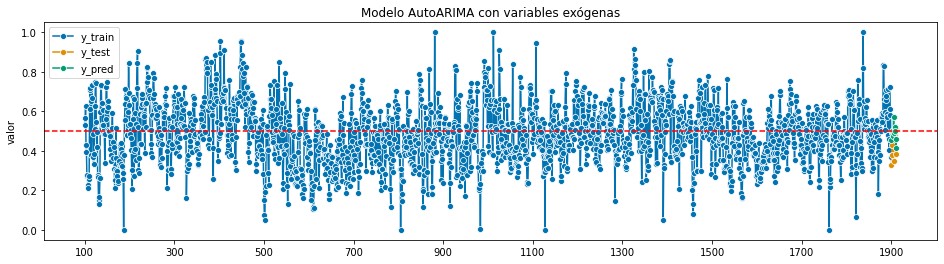

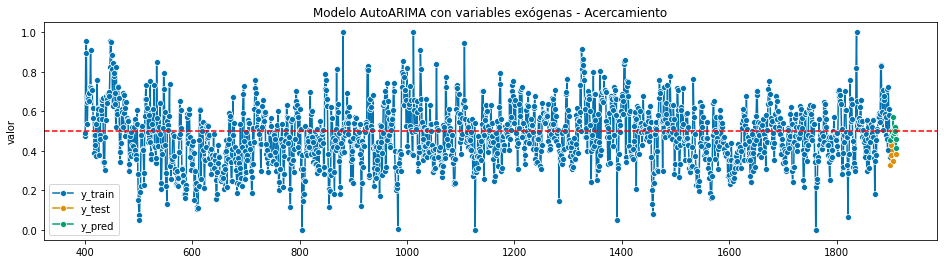

indice:spi, escala3, cluster1


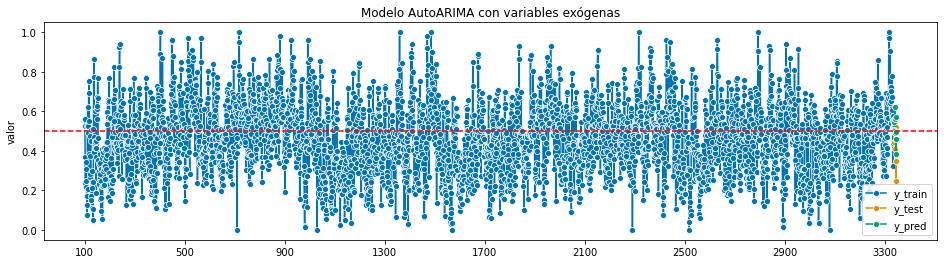

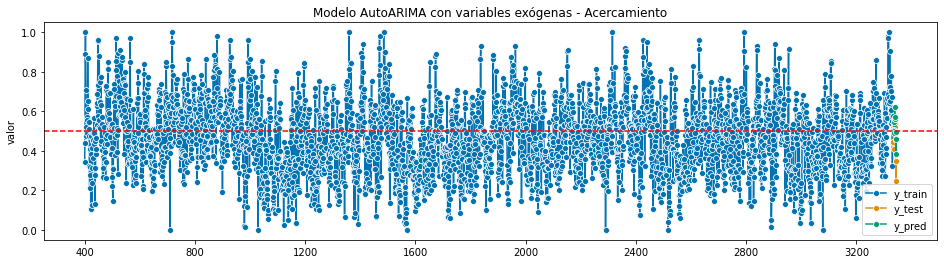

indice:spi, escala3, cluster2


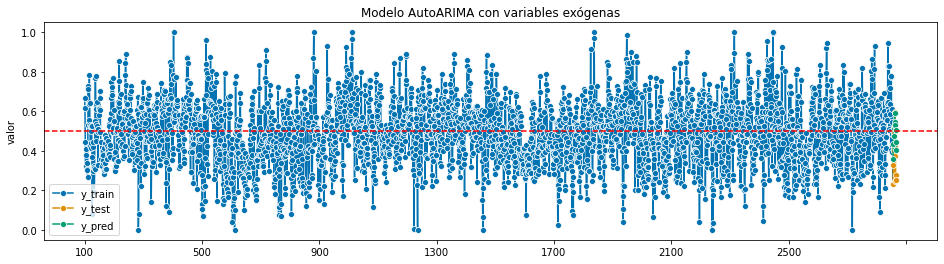

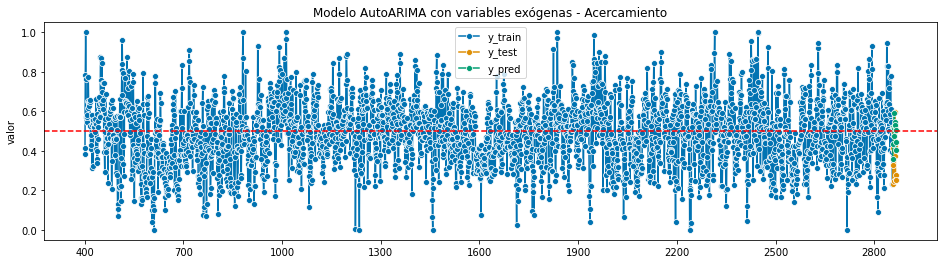

indice:spi, escala3, cluster3


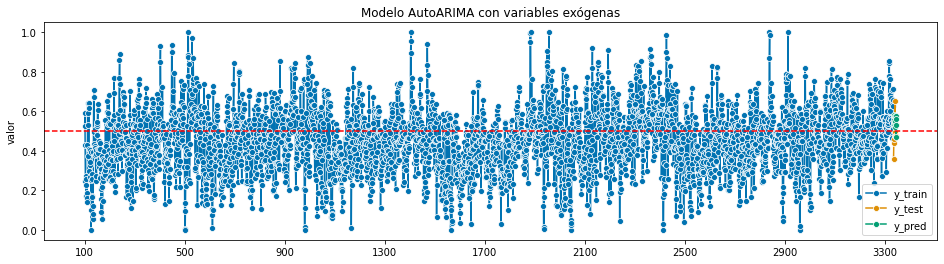

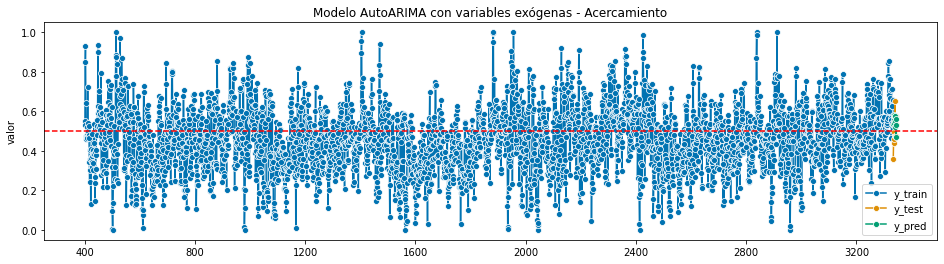

indice:spi, escala12, cluster0


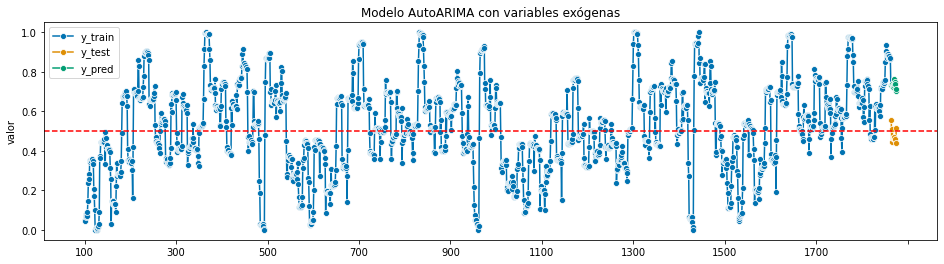

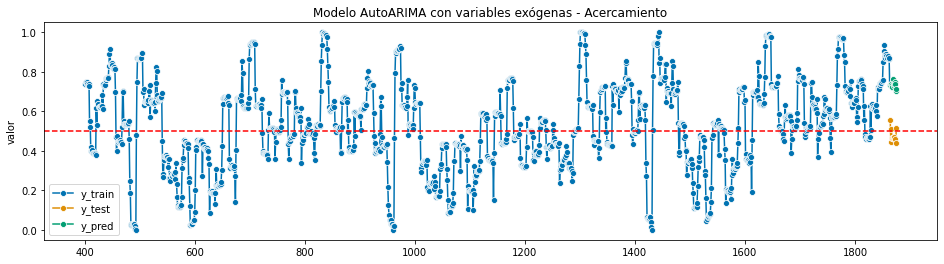

indice:spi, escala12, cluster1


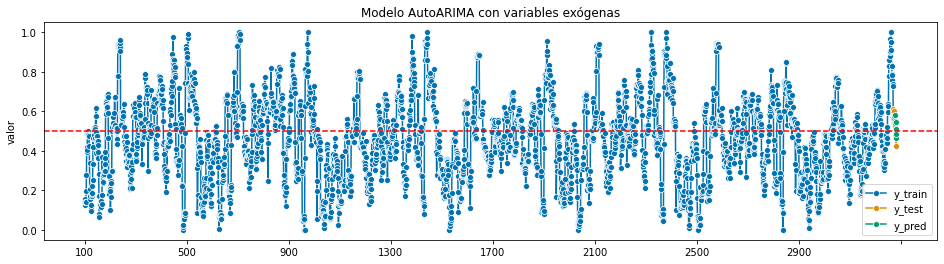

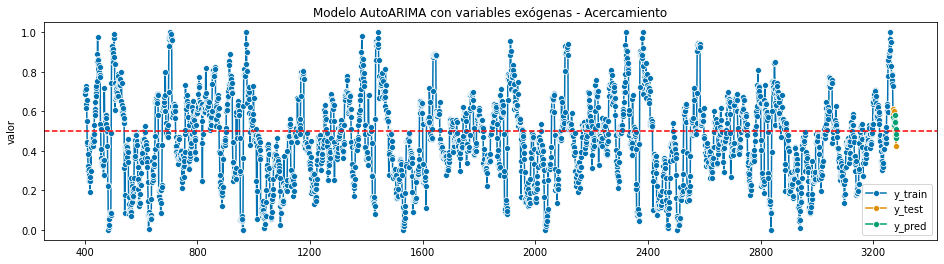

indice:spi, escala12, cluster2


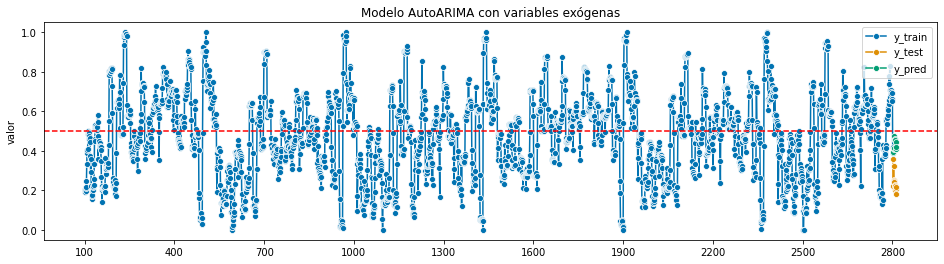

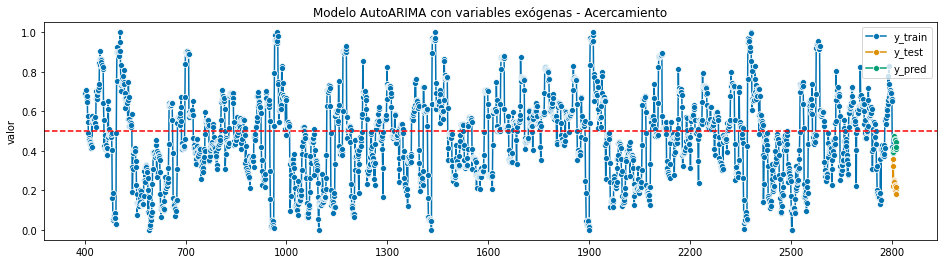

indice:spi, escala12, cluster3


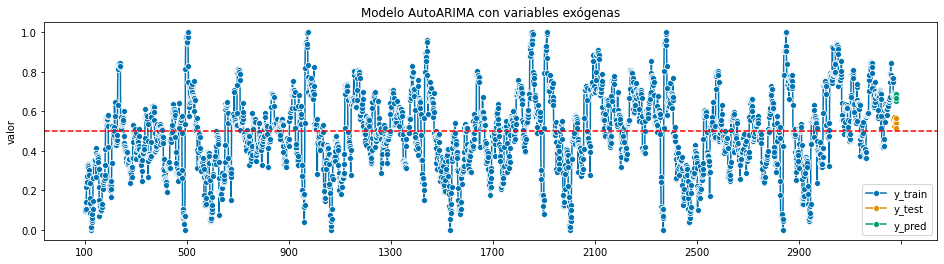

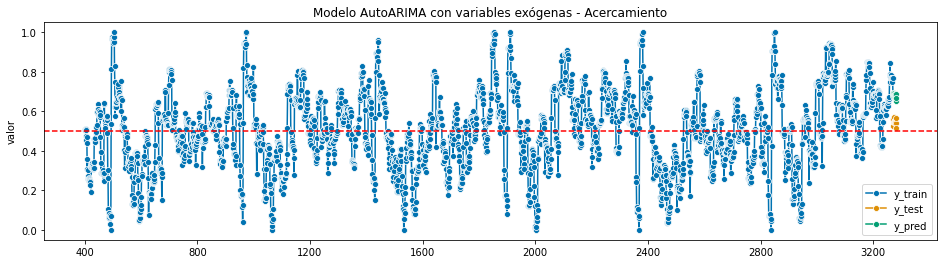

indice:spei, escala3, cluster0


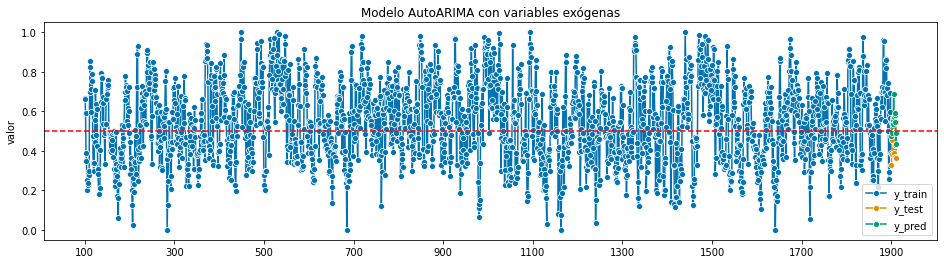

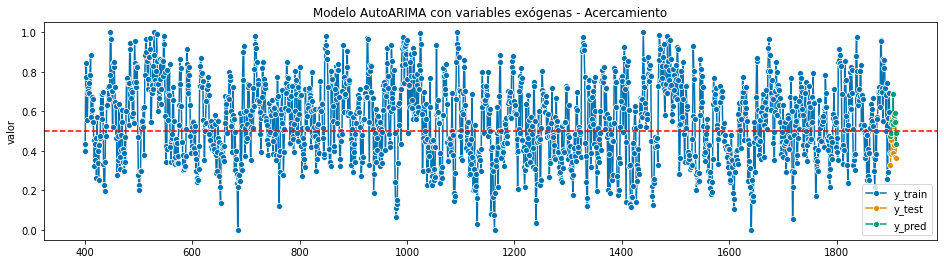

indice:spei, escala3, cluster1


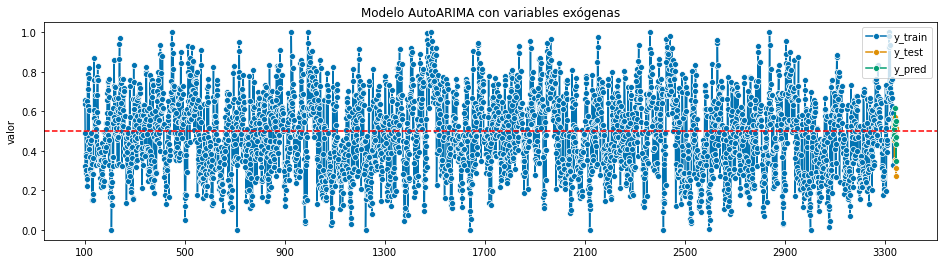

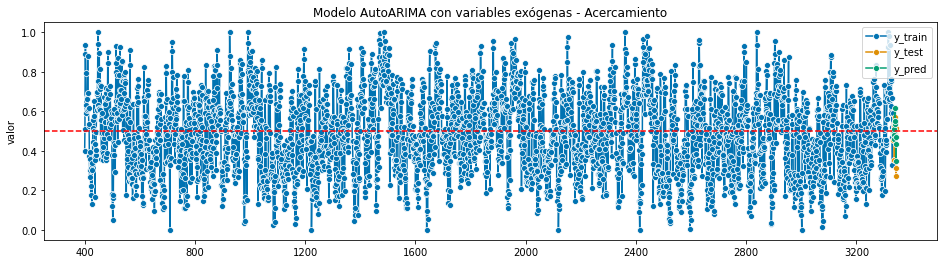

indice:spei, escala3, cluster2


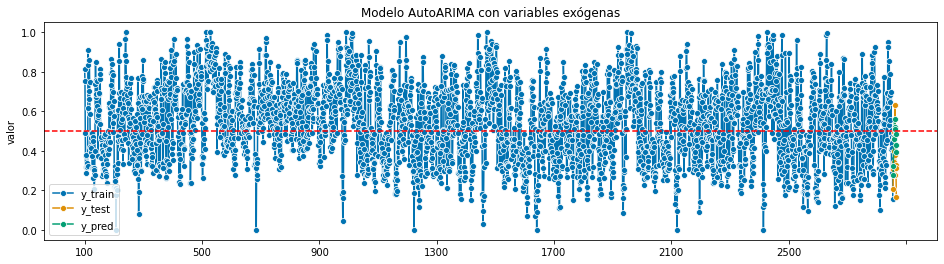

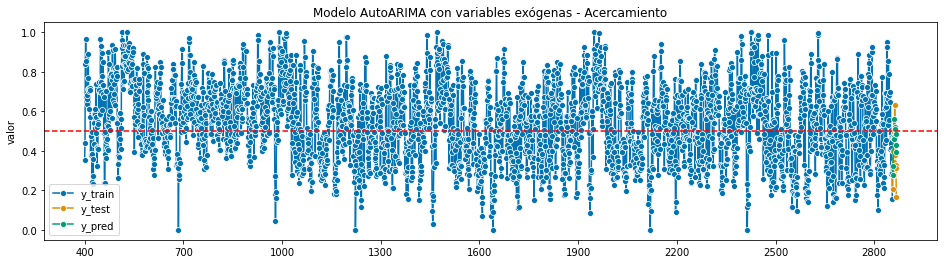

indice:spei, escala3, cluster3


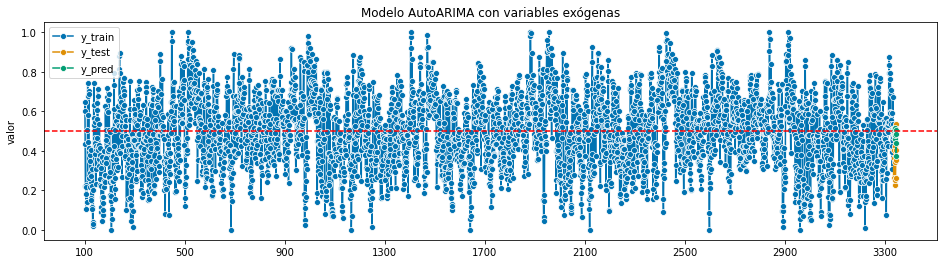

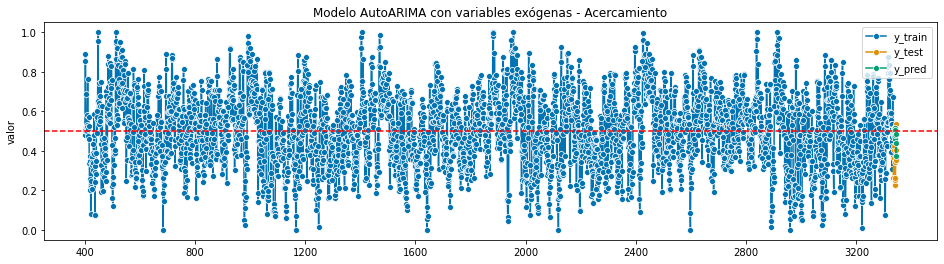

indice:spei, escala12, cluster0


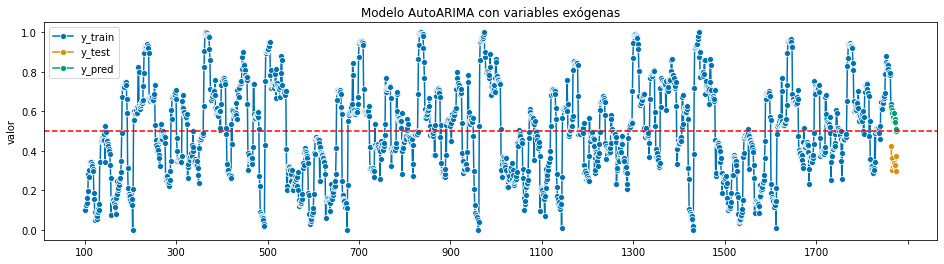

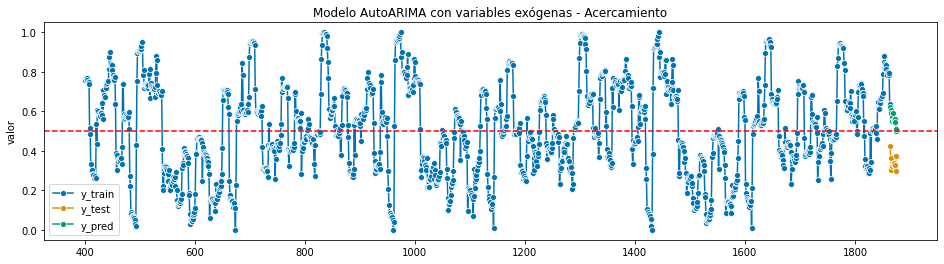

indice:spei, escala12, cluster1


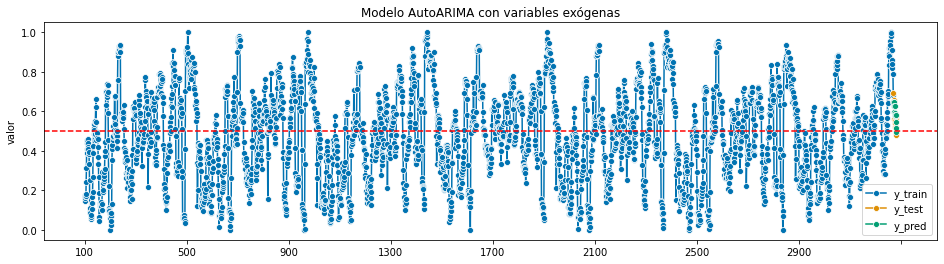

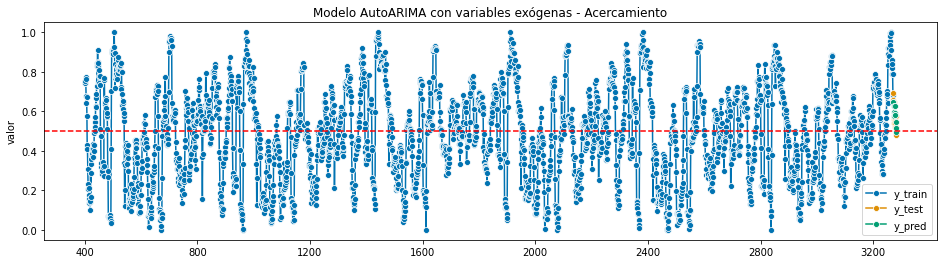

indice:spei, escala12, cluster2


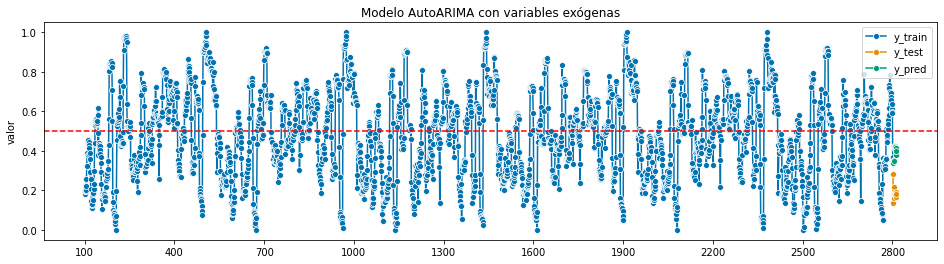

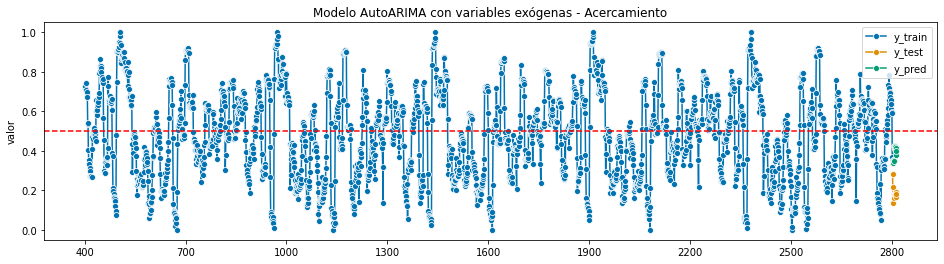

indice:spei, escala12, cluster3


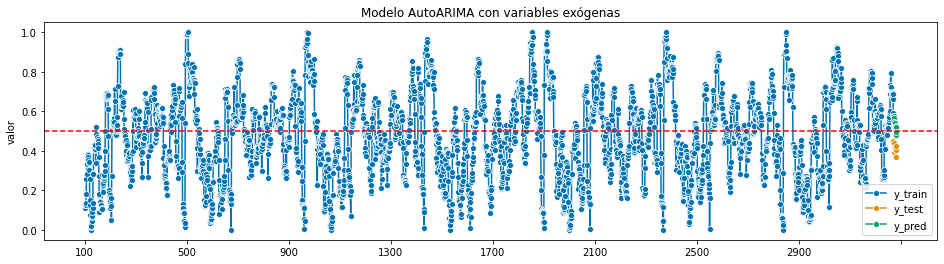

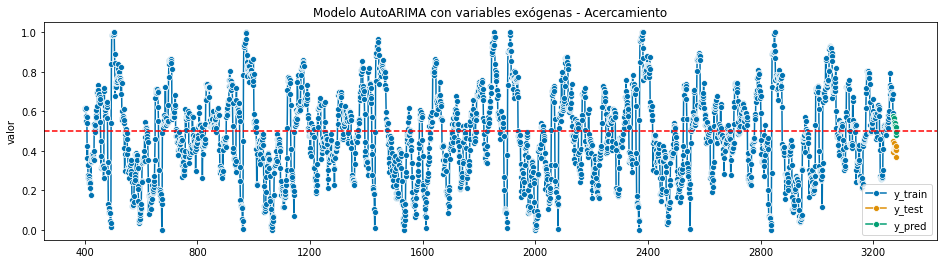

In [12]:
from sktime.forecasting.arima import AutoARIMA
#AutoARIMA para SPI con variables exogenas
aa_eval = pd.DataFrame(index=['mape','mae','rmse','mse'])
aa_pred = pd.DataFrame()
hpred = np.arange(12) + 1
for i in lista_indice:
  for e in lista_escala:
    for c in lista_cluster:
      # Cargar el dataset de variables exógenas
      tmed=cargar_series('nasa/nasa_mensual_tmed_bc.csv',e)
      hmed=cargar_series('nasa/nasa_mensual_hmed_bc.csv',e)
      oni=cargar_series('noaa/noaa_mensual_oni.csv',e)
      print(f'indice:{i}, escala{e}, cluster{c}')
      # Variables exogenas y los datos de SPI-SPEI
      X=crear_exogenas(minmax_norm(tmed),minmax_norm(hmed),minmax_norm(oni),cluster,c)
      spi=cargar_series('spi_spei/indices_'+i+str(e)+'.csv',e)
      y=gen_cluster(cluster, c, minmax_norm(spi))  

      #AutoARIMA para SPI con variables exogenas
      y_train, y_test, X_train, X_pred = temporal_train_test_split(y, X, fh=hpred) #X representa las variables exógenas
      predictor = AutoARIMA(suppress_warnings=True)
      predictor.fit(y_train, X_train)
      y_pred = predictor.predict(hpred, X=X_pred)
      datos_eval = evaluar_modelo(y_test, y_pred)

      #Evaluar
      aa_pred[i+str(e)+'_c'+str(c)] = y_pred.reset_index(drop=True)
      aa_eval[i+str(e)+'_c'+str(c)] = datos_eval

      
      graficar_modelo(y_train,y_test,y_pred, 'Modelo AutoARIMA con variables exógenas',100)
      graficar_modelo(y_train,y_test,y_pred, 'Modelo AutoARIMA con variables exógenas - Acercamiento',400)
      





In [13]:
aa_eval

,spi3_c0,spi3_c1,spi3_c2,spi3_c3,spi12_c0,spi12_c1,spi12_c2,spi12_c3,spei3_c0,spei3_c1,spei3_c2,spei3_c3,spei12_c0,spei12_c1,spei12_c2,spei12_c3
mape,0.150928,0.155129,0.483752,0.147478,0.546046,0.069017,0.838579,0.247207,0.273429,0.141209,0.410886,0.463209,0.672047,0.057010,1.115275,0.293899
mae,0.057130,0.060245,0.142215,0.068834,0.256813,0.035291,0.186655,0.134473,0.109199,0.056213,0.115333,0.135317,0.224102,0.032080,0.197257,0.120773
rmse,0.085863,0.074369,0.164838,0.089195,0.259372,0.041440,0.197499,0.135420,0.135859,0.070390,0.141541,0.160200,0.227402,0.039735,0.203727,0.123157
mse,0.007372,0.005531,0.027172,0.007956,0.067274,0.001717,0.039006,0.018338,0.018458,0.004955,0.020034,0.025664,0.051712,0.001579,0.041505,0.015168


In [ ]:
#predictor.get_params(deep=True)

indice:spi, escala3, cluster0


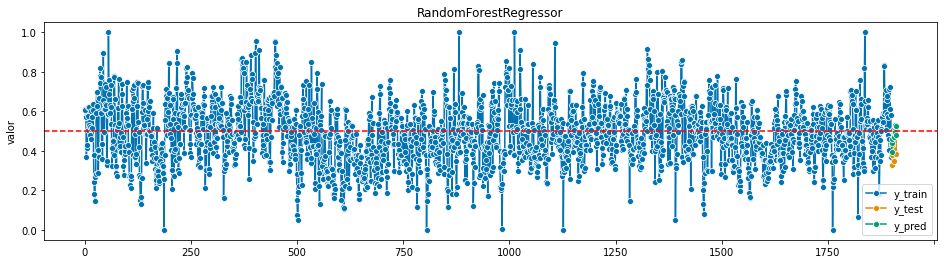

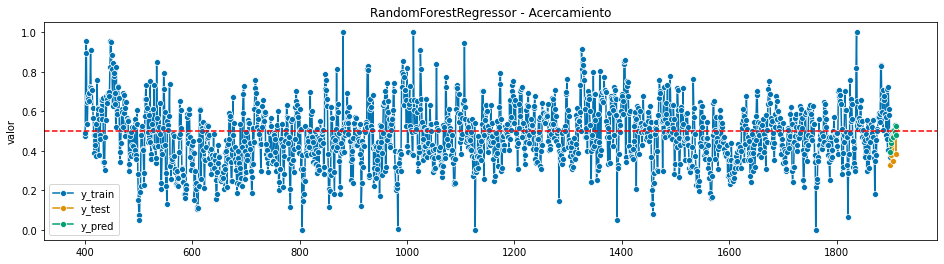

indice:spi, escala3, cluster1


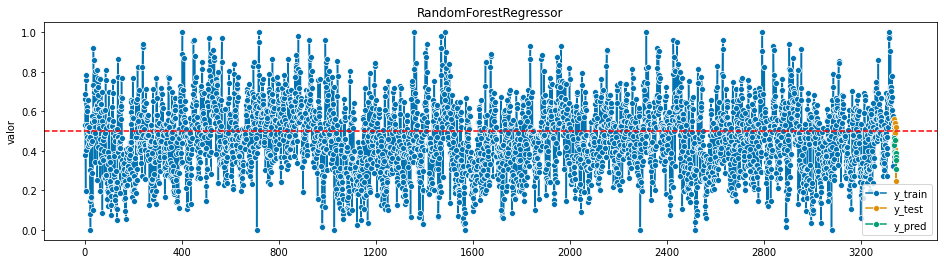

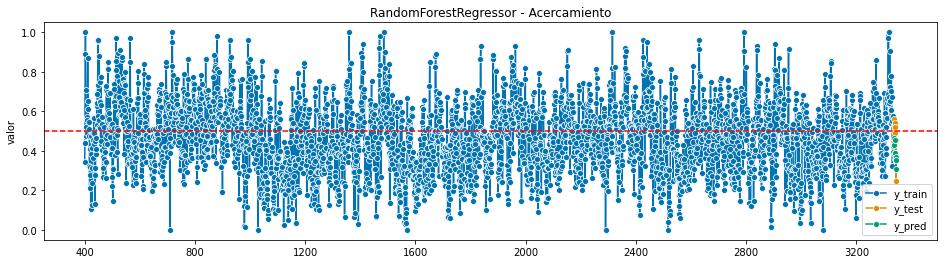

indice:spi, escala3, cluster2


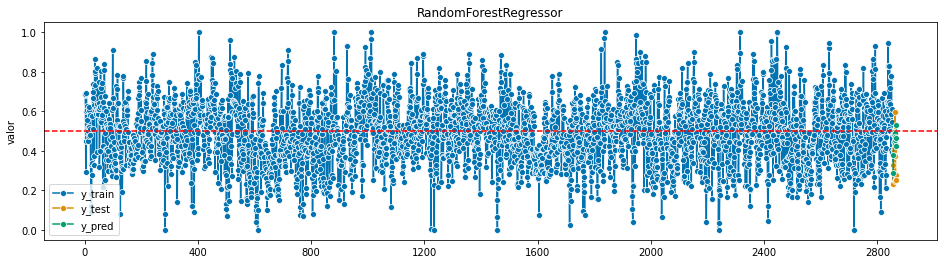

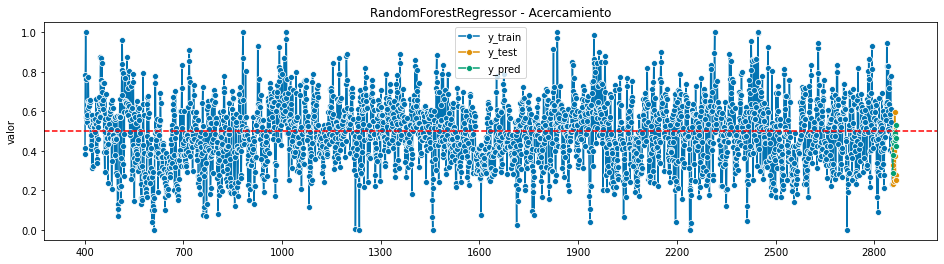

indice:spi, escala3, cluster3


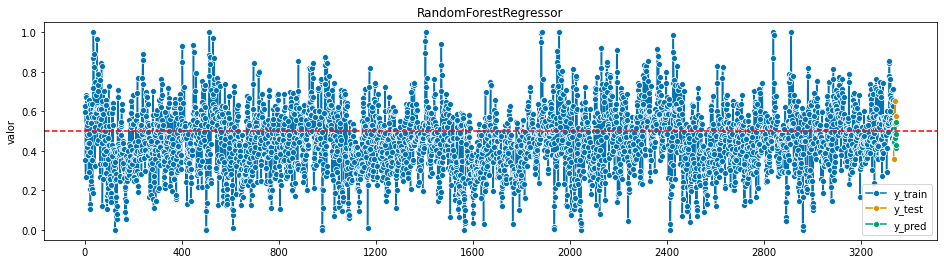

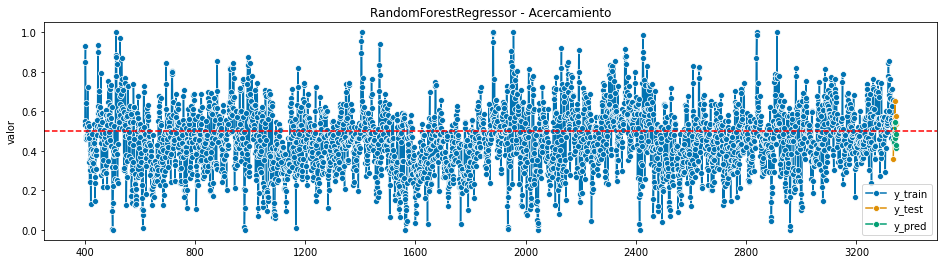

indice:spi, escala12, cluster0


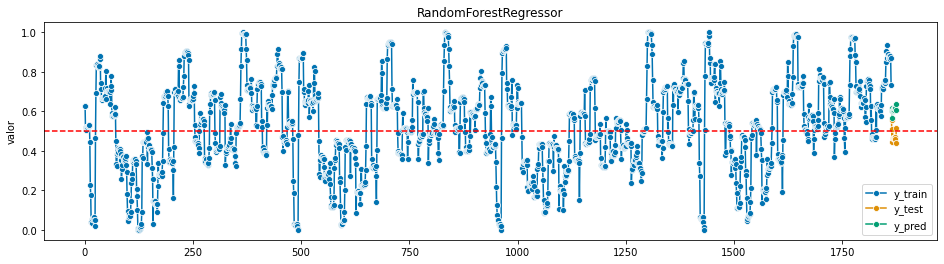

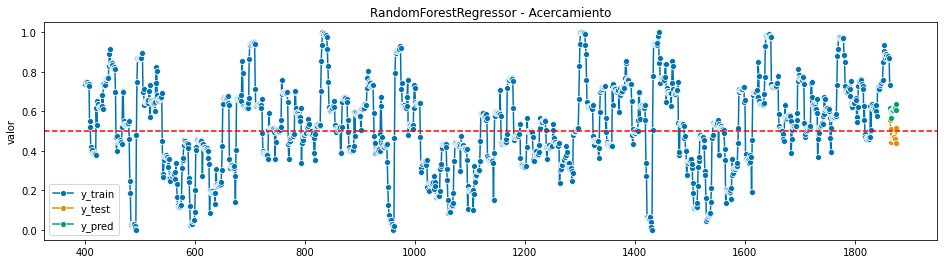

indice:spi, escala12, cluster1


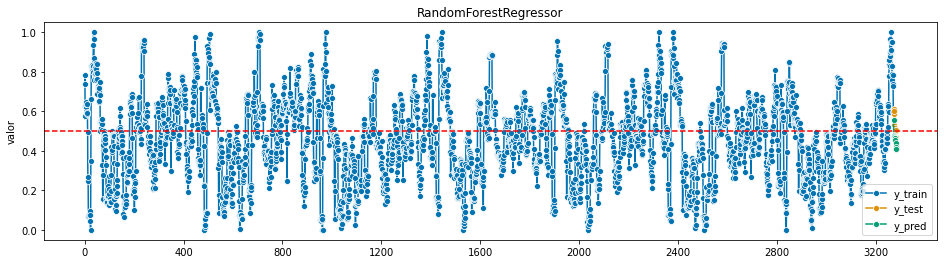

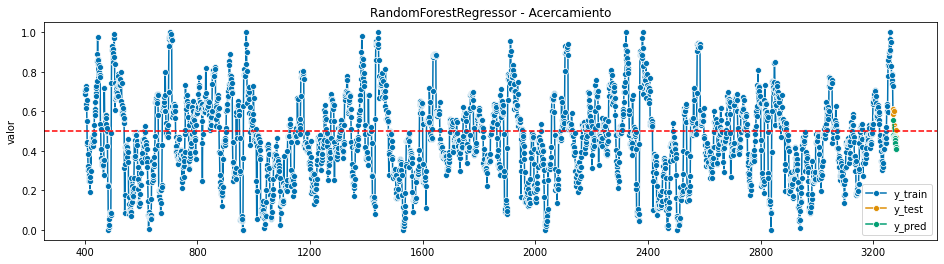

indice:spi, escala12, cluster2


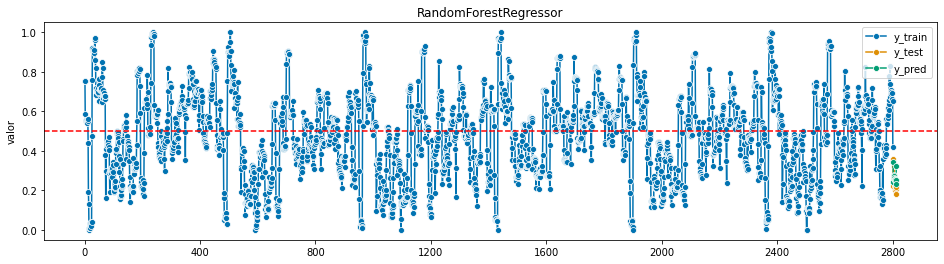

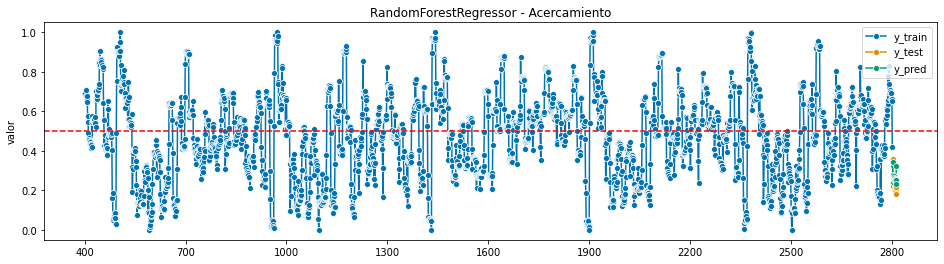

indice:spi, escala12, cluster3


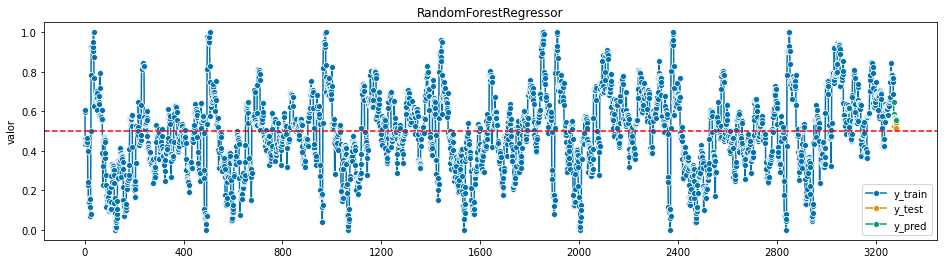

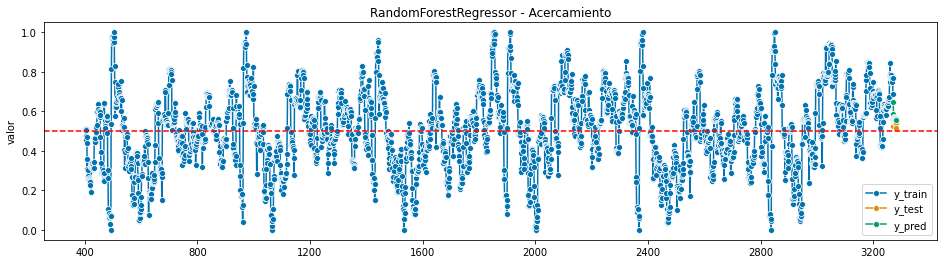

indice:spei, escala3, cluster0


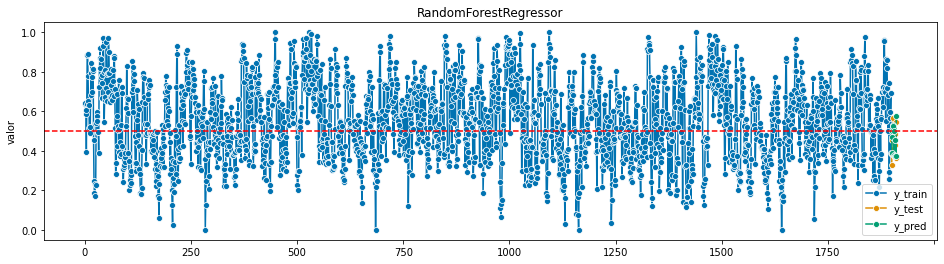

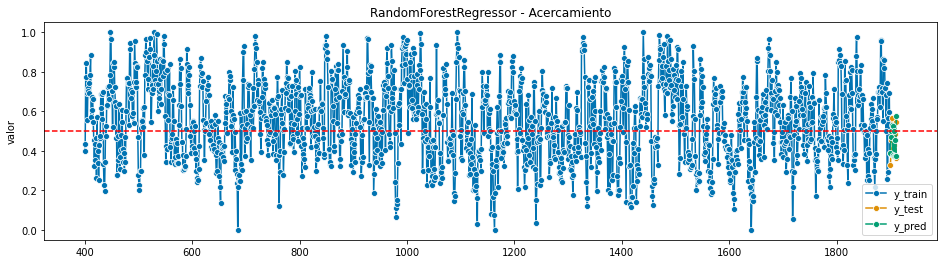

indice:spei, escala3, cluster1


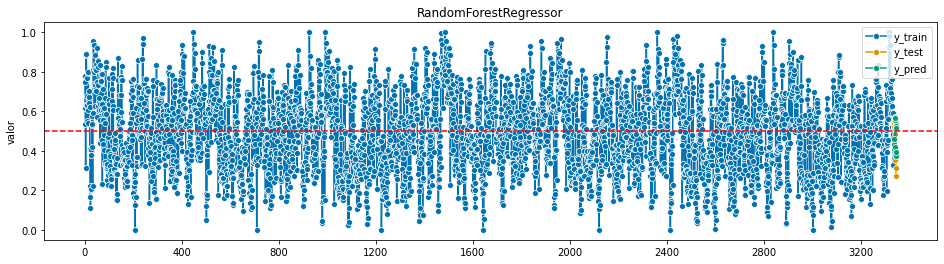

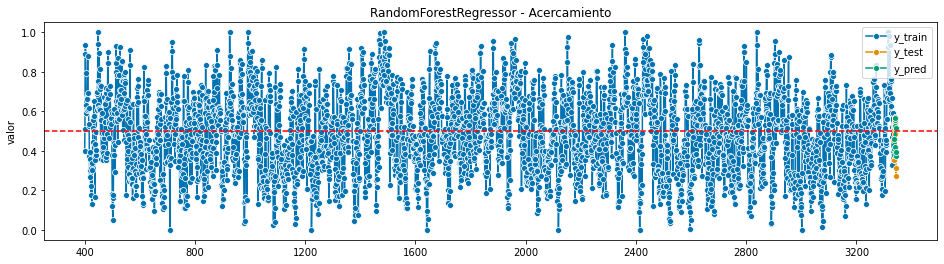

indice:spei, escala3, cluster2


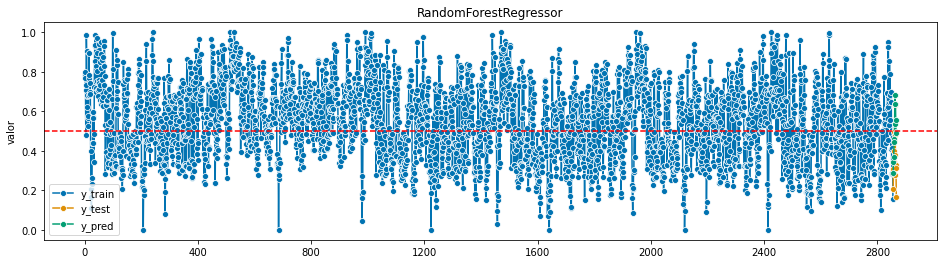

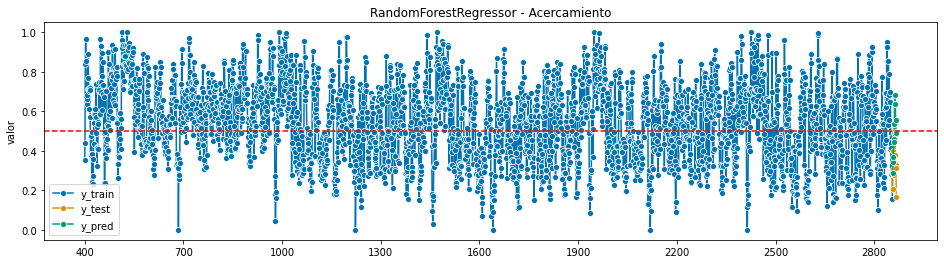

indice:spei, escala3, cluster3


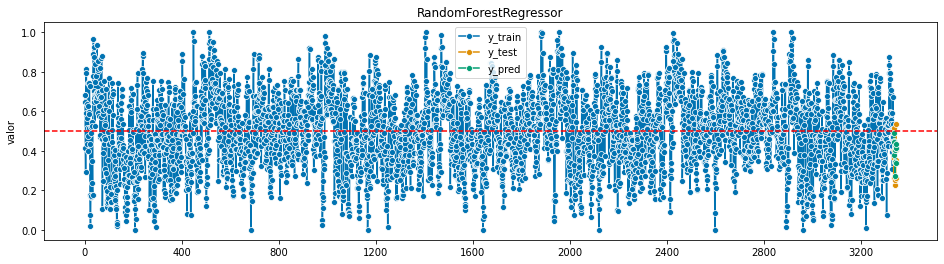

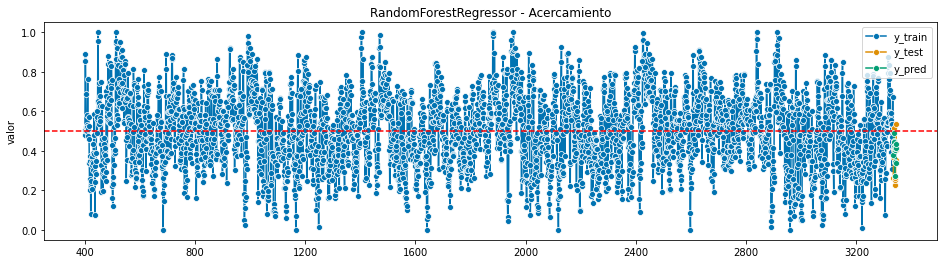

indice:spei, escala12, cluster0


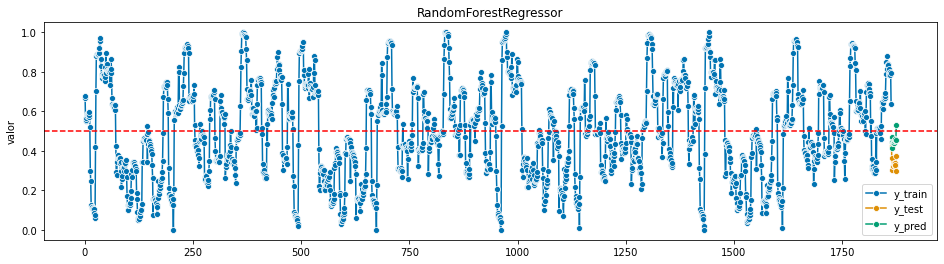

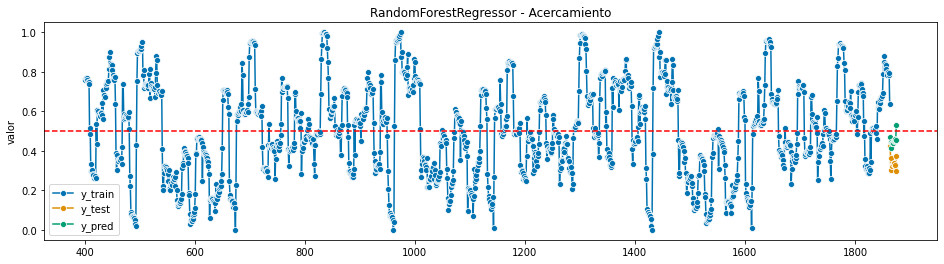

indice:spei, escala12, cluster1


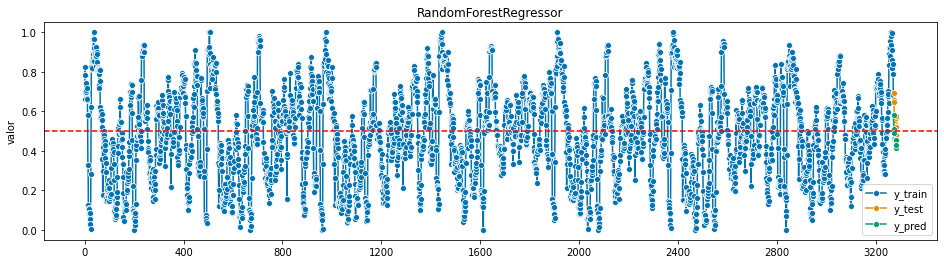

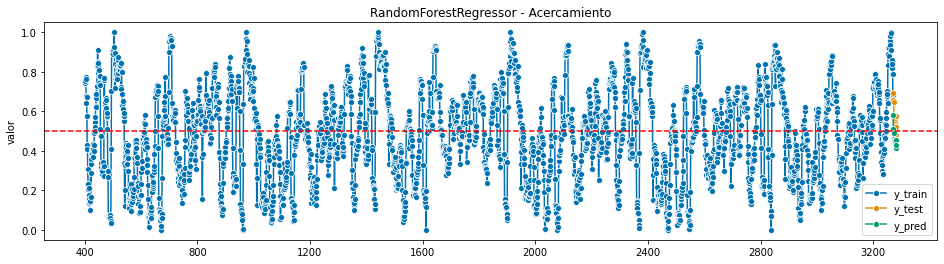

indice:spei, escala12, cluster2


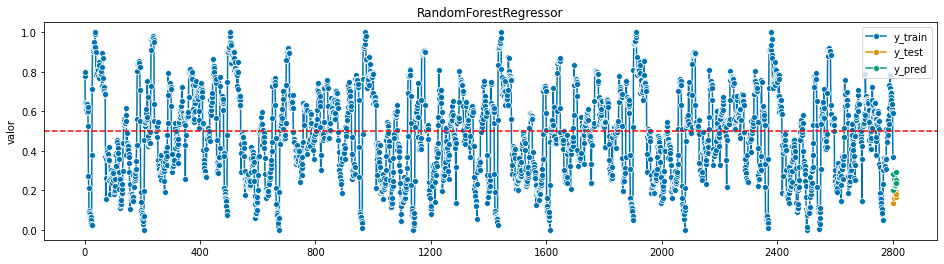

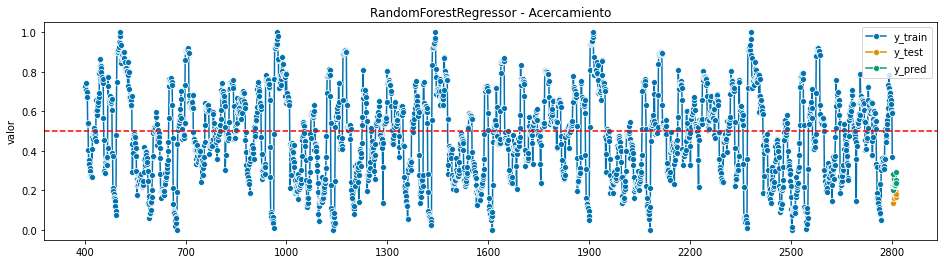

indice:spei, escala12, cluster3


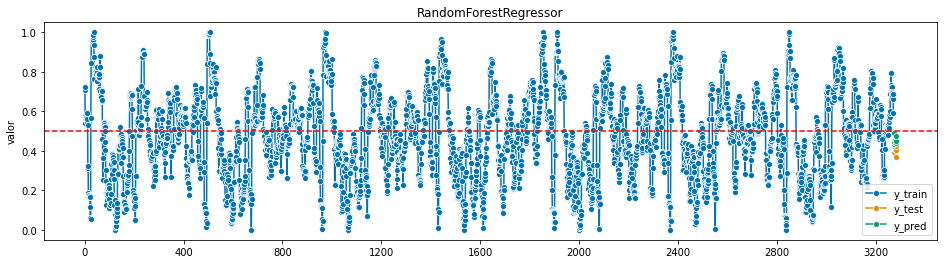

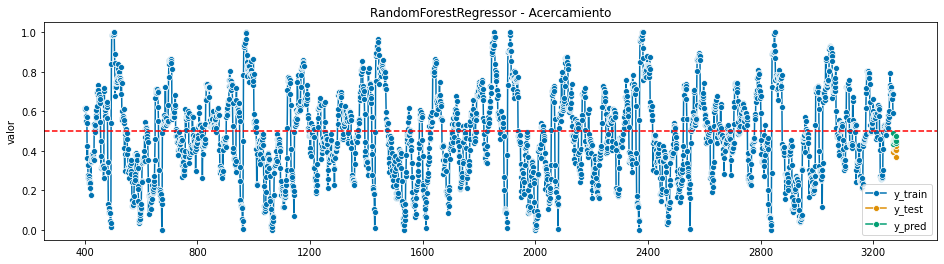

In [14]:
#RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor
from sktime.forecasting.compose import make_reduction

rf_eval = pd.DataFrame(index=['mape','mae','rmse','mse'])
rf_pred = pd.DataFrame()
hpred = np.arange(12) + 1
for i in lista_indice:
  for e in lista_escala:
    for c in lista_cluster:
      # Cargar el dataset de variables exógenas
      tmed=cargar_series('nasa/nasa_mensual_tmed_bc.csv',e)
      hmed=cargar_series('nasa/nasa_mensual_hmed_bc.csv',e)
      oni=cargar_series('noaa/noaa_mensual_oni.csv',e)
      print(f'indice:{i}, escala{e}, cluster{c}')
      # Variables exogenas y los datos de SPI-SPEI
      X=crear_exogenas(minmax_norm(tmed),minmax_norm(hmed),minmax_norm(oni),cluster,c)
      spi=cargar_series('spi_spei/indices_'+i+str(e)+'.csv',e)
      y=gen_cluster(cluster, c, minmax_norm(spi))       

      #RandomForestRegressor
      y_train, y_test, X_train, X_pred = temporal_train_test_split(y, X, fh=hpred) #X representa las variables exógenas
      regresor = RandomForestRegressor(n_estimators=30)
      predictor = make_reduction(regresor, strategy="recursive", window_length=48) #swindow_length=48
      predictor.fit(y_train,X_train)
      y_pred = predictor.predict(hpred,X=X_pred)
      graficar_modelo(y_train,y_test,y_pred, 'RandomForestRegressor',0)
      graficar_modelo(y_train,y_test,y_pred, 'RandomForestRegressor - Acercamiento',400)
      datos_eval = evaluar_modelo(y_test, y_pred)

      #Evaluar
      rf_pred[i+str(e)+'_c'+str(c)] = y_pred.reset_index(drop=True)
      rf_eval[i+str(e)+'_c'+str(c)] = datos_eval

In [15]:
rf_eval

,spi3_c0,spi3_c1,spi3_c2,spi3_c3,spi12_c0,spi12_c1,spi12_c2,spi12_c3,spei3_c0,spei3_c1,spei3_c2,spei3_c3,spei12_c0,spei12_c1,spei12_c2,spei12_c3
mape,0.104112,0.173175,0.370435,0.107375,0.282913,0.112984,0.164571,0.052250,0.073536,0.132025,0.514005,0.208120,0.346711,0.185043,0.313684,0.106697
mae,0.040080,0.082763,0.107602,0.055638,0.132509,0.060411,0.036913,0.028276,0.030493,0.054767,0.144357,0.062938,0.114994,0.106747,0.054216,0.043320
rmse,0.055112,0.093157,0.133986,0.069991,0.135809,0.068001,0.044380,0.036378,0.039905,0.068305,0.175185,0.083084,0.118737,0.109648,0.060443,0.046268
mse,0.003037,0.008678,0.017952,0.004899,0.018444,0.004624,0.001970,0.001323,0.001592,0.004666,0.030690,0.006903,0.014098,0.012023,0.003653,0.002141
